In [2]:
import pandas as pd
from zipfile import ZipFile
from zipfile import is_zipfile
import io
import numpy as np
from PIL import Image
import time
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg 
import glob
import cv2
from keras import models
from keras import layers
import shutil
import os
import glob
from keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model

/home/g404tests/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


#### Definición del problema

A partir de un conjunto de imágenes de tejido mamario se pretende construír una red neuronal que sea capaz de predecir con un porcentaje alto de probabilidad si un tejido dado es susceptible considerarse o no canceroso.


#### Exploración de los datos
Se han dividido las imágenes en la siguiente estructura de directorios:

train/cancer

train/no_cancer

val/cancer

val/no_cancer



A continuación se muestra el número de imágenes de cada directorio

In [3]:
imageTrainCancer = glob.glob( 'train/cancer/*.tif', recursive=True)
imageTrainNoCancer = glob.glob( 'train/no_cancer/*.tif', recursive=True)
imageValCancer = glob.glob( 'val/cancer/*.tif', recursive=True)
imageValNoCancer = glob.glob( 'val/no_cancer/*.tif', recursive=True)
imageTest = glob.glob( 'test/*.tif', recursive=True)

print('Imágenes de train cancer '+str(len(imageTrainCancer)))
print('Imágenes de train no cancer '+str(len(imageTrainNoCancer)))
print('Imágenes de val cancer '+str(len(imageValCancer)))
print('Imágenes de val no cancer '+str(len(imageValNoCancer)))
print('Imágenes de test '+str(len(imageTest)))


Imágenes de train cancer 65776
Imágenes de train no cancer 96791
Imágenes de val cancer 23341
Imágenes de val no cancer 34117
Imágenes de test 57458


Tal y como se puede observar, en los grupos de train y validation, el porcentaje de imágenes cancersosas es del 59%.
Ambos grupos están creados con la misma proporción de casos cancerosos/no cancerosos.

##### Forma de las imágenes

In [3]:
imagenEjemlo=cv2.imread(imageTrainCancer[0])
print(imagenEjemlo.shape)

(96, 96, 3)


Tal y como se aprecia, cada imágen tiene la siguiente forma: (96,96,3)

#### Ejemplos de imágenes con tejido canceroso

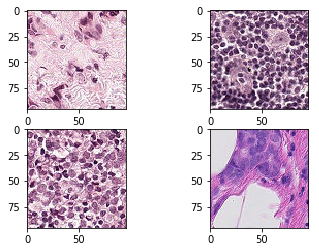

In [4]:
fig, axes = plt.subplots(2,2)
i=0
for i in range(4):    
    imagenCancerosa=imageTrainCancer[i]
    img=mpimg.imread(imagenCancerosa,'r')
    axes[i//2,i%2].imshow(img)
    plt.imshow(img)
    i+=1

#### Ejemplos de imágenes con tejido no canceroso

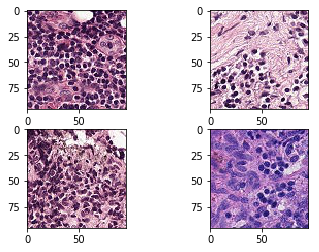

In [5]:
fig, axes = plt.subplots(2,2)
i=0
for i in range(4):    
    imagenCancerosa=imageTrainNoCancer[i]
    img=mpimg.imread(imagenCancerosa,'r')
    axes[i//2,i%2].imshow(img)
    plt.imshow(img)
    i+=1

### Creación y ejecución de modelo de predicción 

In [3]:
#Constantes
IMAGES_TRAIN=162566
IMAGES_VAL=57458
IMAGES_TEST=57458

#### Creación de GridSearchCV personalizado para fit_generator

In [4]:
import random
class EstimadorParametros:
   
  

    def __init__(self,estimator,param_grid,epochs=3):
        self.estimator = estimator
        self.param_grid = param_grid
        self.epochs = epochs

        keys=param_grid.keys()
        modelos=[]
        self.parametrosListado=[]
        parametrosNombres=list(param_grid.keys())
        parametros1=param_grid[parametrosNombres[0]]
        parametros2=param_grid[parametrosNombres[1]]

        for i in parametros1:
            for j in parametros2:             
                parametros=[i,j]
                self.parametrosListado.append(parametros)

        #Mejores parámetros obtenidos
        self.best_params_= []

    #Fit_generator, en el cual se hacen llamadas a fit_generator por cada modelo creado
    def fit_generator(self, train_gen,steps_per_epoch,val_data,val_steps,ep,verb, work):
        lowestLoss=1000
        
        #Se hacen llamadas a fit_generator por cada modelo creado (array modelos)
        #Los mejores parámetros se acabarán guardando en best_params
        for parametros in self.parametrosListado:
            print('fit_geneartor con'+str(parametros))
            modelo=self.estimator(*parametros)
           
            history=modelo.fit_generator(train_gen, steps_per_epoch=steps_per_epoch, 
                        validation_data=val_data,
                        validation_steps=val_steps,
                        epochs=ep, verbose=verb, workers=work)   
            
                        
            
            loss,accuracy = modelo.evaluate_generator(val_gen)
            print('loss {} '.format(loss))
            
           
            if loss<lowestLoss:               
                self.best_params_=parametros
                lowestLoss=loss               
     

#### Funciones para generadores de imágenes (Sin DataUgmentation)

In [8]:
def crearGeneradores(batch_size):
    datagen = ImageDataGenerator(rescale=1.0/255) #Se aplica normalización
    train_gen = datagen.flow_from_directory('train',
                                            target_size=(96,96),
                                            batch_size=batch_size,
                                            class_mode='categorical')

    val_gen = datagen.flow_from_directory('val',
                                            target_size=(96,96),
                                            batch_size=batch_size,
                                            class_mode='categorical')

   
    return train_gen, val_gen

def crearGeneradorTest():
    datagen = ImageDataGenerator(rescale=1.0/255) #Se aplica normalización
    test_gen = datagen.flow_from_directory('val',
                                            target_size=(96,96),
                                            batch_size=1,
                                            class_mode='categorical',
                                            shuffle=False)
    return test_gen

#### Función para generadores de imágenes (Con DataUgmentation)

In [5]:
def crearGeneradoresDA(batch_size):

    
    datagenDA = ImageDataGenerator(rescale=1./255,
                        rotation_range=180, # grados de rotacion aleatoria                       
                        vertical_flip=True,
                        width_shift_range=0.1, # fraccion del total (1) para mover la imagen
                        height_shift_range=0.1, # fraccion del total (1) para mover la imagen
                        shear_range=0.2, # deslizamiento
                        zoom_range=0.1, # rango de zoom
                        horizontal_flip=True, # girar las imagenes horizontalmente (eje vertical)                       
                        brightness_range=[0.1,0.2]  )  
                    

    
    
    train_gen = datagenDA.flow_from_directory('train',
                                            target_size=(96,96),
                                            batch_size=batch_size,
                                            class_mode='categorical')

    val_gen = datagenDA.flow_from_directory('val',
                                            target_size=(96,96),
                                            batch_size=batch_size,
                                            class_mode='categorical')

   
    return train_gen, val_gen

#### Función para visualizar el modelo

In [6]:
def visualizarModelo(history):
  #accuracy
    epochs = np.arange(1,len(history.history['acc'])+1)
    plt.title('Accuracy over training')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.plot(epochs,history.history['acc'],'r',label='training accuracy')
    plt.plot(epochs,history.history['val_acc'],'b',label='validation accuracy')
    plt.legend(loc='best')
    plt.show()
  
    #loss
    epochs = np.arange(1,len(history.history['loss'])+1)
    plt.title('Loss over training')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.plot(epochs,history.history['loss'],'r',label='training loss')
    plt.plot(epochs,history.history['val_loss'],'b',label='validation loss')
    plt.legend(loc='best')
    plt.show()

#### Creación de modelo secuencial  

In [8]:
from keras import models
from keras import layers    
from keras import optimizers

def crearModeloSecuencial(dropout=0.3,optimizerType='Adam'):   
    model = models.Sequential()
    model.add(layers.Conv2D(32,(3,3),input_shape=(96,96,3)))     
    model.add(layers.MaxPooling2D((2,2)))
    
    model.add(layers.Conv2D(32,(3,3),activation='relu', padding='same'))
    model.add(layers.Conv2D(32,(3,3),activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(dropout))
    model.add(layers.Conv2D(64,(3,3),activation='relu', padding='same'))
    model.add(layers.Conv2D(64,(3,3),activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(dropout))
    model.add(layers.Conv2D(128,(3,3),activation='relu', padding='same'))
    model.add(layers.Conv2D(128,(3,3),activation='relu', padding='same'))
    
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(dropout))
    model.add(layers.Conv2D(256,(3,3),activation='relu', padding='same'))
    model.add(layers.Conv2D(256,(3,3),activation='relu', padding='same'))
    
    
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(dropout))
    model.add(layers.Flatten())
    
    model.add(layers.Dense(64,activation='relu')) 
    model.add(layers.Dropout(dropout))
    model.add(layers.Dense(2,activation='sigmoid'))
    
    if optimizerType=='Adam':
        optimizer = optimizers.Adam(lr=0.001)
    elif optimizerType=='SGD':
        optimizer = optimizers.SGD(lr=0.001, momentum=0.9, nesterov=True)
    
    
    model.compile(optimizer=optimizer,
               loss='categorical_crossentropy',
               metrics=['accuracy'])       
           
    return model

### Estimador de parámetros

In [11]:
BATCH_SIZE=100
LEARNING_RATE=0.001
DROPOUT=0.3
train_gen,val_gen=crearGeneradores(BATCH_SIZE)
#Optimizers, Dropout
param_grid = {'dropout': [0.2,0.3,0.5],
    'optimizers': ['Adam', 'SGD'],}


grid = EstimadorParametros(crearModeloSecuencial,param_grid)

grid_result = grid.fit_generator(train_gen, IMAGES_TRAIN//BATCH_SIZE, 
                    val_gen,
                    IMAGES_VAL//BATCH_SIZE,
                    2, 1, 4)

print('Mejores parametros '+str(grid.best_params_))

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
fit_geneartor con[0.2, 'Adam']
Epoch 1/2
1625/1625 [==============================] - 1582s 974ms/step - loss: 0.4259 - acc: 0.8045 - val_loss: 0.3251 - val_acc: 0.8609
Epoch 2/2
1625/1625 [==============================] - 476s 293ms/step - loss: 0.3075 - acc: 0.8727 - val_loss: 0.2604 - val_acc: 0.8954
loss 0.26073131991441467 
fit_geneartor con[0.2, 'SGD']
Epoch 1/2
1625/1625 [==============================] - 473s 291ms/step - loss: 0.6184 - acc: 0.6498 - val_loss: 0.5432 - val_acc: 0.7631
Epoch 2/2
1625/1625 [==============================] - 473s 291ms/step - loss: 0.4617 - acc: 0.7973 - val_loss: 0.4278 - val_acc: 0.8122
loss 0.4277241441663596 
fit_geneartor con[0.3, 'Adam']
Epoch 1/2
1625/1625 [==============================] - 483s 297ms/step - loss: 0.4895 - acc: 0.7550 - val_loss: 0.3521 - val_acc: 0.8479
Epoch 2/2
1625/1625 [==============================] - 475s 293ms/step - loss: 0.344

#### Entrenamiento con los parámetros definitivos
dropout:0.2
optimizer:Adam

In [ ]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
DROPOUT = 0.2

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

modeloSecuencial=crearModeloSecuencial(DROPOUT,'Adam')


earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('ModeloSecuencial.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('ModeloSecuencial_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')

history = modeloSecuencial.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=30, verbose=1, workers=4)


#visualizarModelo(history)  

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
Epoch 1/30
1625/1625 [==============================] - 483s 297ms/step - loss: 0.4233 - acc: 0.8078 - val_loss: 0.3545 - val_acc: 0.8448
Epoch 2/30
1625/1625 [==============================] - 484s 298ms/step - loss: 0.3189 - acc: 0.8650 - val_loss: 0.2876 - val_acc: 0.8814
Epoch 3/30
1625/1625 [==============================] - 481s 296ms/step - loss: 0.2721 - acc: 0.8888 - val_loss: 0.2488 - val_acc: 0.9008
Epoch 4/30
1625/1625 [==============================] - 479s 295ms/step - loss: 0.2464 - acc: 0.9019 - val_loss: 0.2237 - val_acc: 0.9138
Epoch 5/30
1625/1625 [==============================] - 482s 297ms/step - loss: 0.2166 - acc: 0.9148 - val_loss: 0.2038 - val_acc: 0.9211
Epoch 7/30
1625/1625 [==============================] - 481s 296ms/step - loss: 0.2042 - acc: 0.9212 - val_loss: 0.1858 - val_acc: 0.9311
Epoch 8/30
1625/1625 [==============================] - 479s 295ms/step - loss: 0.196

#### Segunda iteración

In [9]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
DROPOUT = 0.2

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

modeloSecuencial=load_model('ModeloSecuencial_tmp.h5')


earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('ModeloSecuencial_2.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('ModeloSecuencial_2_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')

history = modeloSecuencial.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=10, verbose=1, workers=4)

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
Epoch 1/10
1625/1625 [==============================] - 1618s 996ms/step - loss: 0.1362 - acc: 0.9510 - val_loss: 0.1476 - val_acc: 0.9460
Epoch 2/10
1625/1625 [==============================] - 461s 284ms/step - loss: 0.1360 - acc: 0.9504 - val_loss: 0.1478 - val_acc: 0.9459

Epoch 00002: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-08.
Epoch 3/10
1625/1625 [==============================] - 461s 283ms/step - loss: 0.1369 - acc: 0.9496 - val_loss: 0.1476 - val_acc: 0.9461

Epoch 00003: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-09.
Epoch 4/10
1625/1625 [==============================] - 465s 286ms/step - loss: 0.1363 - acc: 0.9504 - val_loss: 0.1476 - val_acc: 0.9460

Epoch 00004: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-10.
Restoring model weights from the end of the best epoch
Epoch 00004: early stopping


#### Visualización gráfica de precisión y pérdida

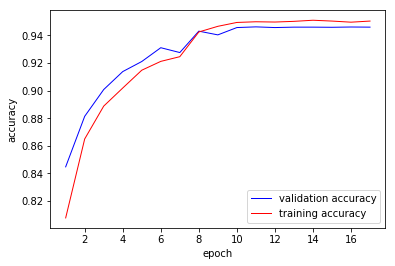

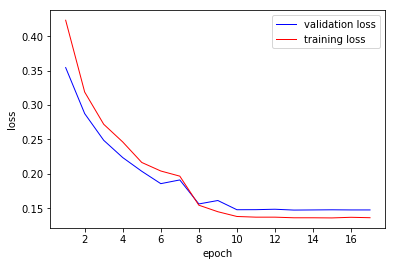

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
fig,axis = plt.subplots(1,1)

validationAcc=[0.8448,0.8814,0.9008,0.9138,0.9211,0.9311, 0.9276,0.9431,0.9404, 0.9457, 0.9462,0.9457, 0.9460, 0.9460,0.9459,0.9461,0.9460] #Datos del eje y para validation accuracy
trainingAcc=[0.8078,0.8650,0.8888,0.9019,0.9148, 0.9212, 0.9246, 0.9425,0.9466,0.9494,0.9499,0.9497,0.9502,0.9510,0.9504,0.9496, 0.9504 ] #Datos del eje y para training accuracy

lista=list(range(1,18)) #Datos para los ejes x
axis.plot(lista,validationAcc,'b-',label='validation accuracy',linewidth=1) 
axis.plot(lista,trainingAcc,'r',label='training accuracy',linewidth=1) 
axis.legend(loc='best') 
axis.set_xlabel('epoch')
axis.set_ylabel('accuracy')
plt.show() 


fig2,axis2 = plt.subplots(1,1)
validationLoss=[0.3545,0.2876 ,0.2488 ,0.2237 ,0.2038 ,0.1858 ,0.1912 ,0.1563 ,0.1613 ,0.1479 ,0.1480 ,0.1486 ,0.1474 ,0.1476 ,0.1478 ,0.1476 ,0.1476 ]
trainingLoss=[0.4233 ,0.3189 ,0.2721 ,0.2464 ,0.2166 ,0.2042 ,0.1967 ,0.1545 ,0.1450 ,0.1381 ,0.1371 ,0.1371 ,0.1362 ,0.1362 ,0.1360 ,0.1369 ,0.1363 ]
axis2.plot(lista,validationLoss,'b-',label='validation loss',linewidth=1) 
axis2.plot(lista,trainingLoss,'r',label='training loss',linewidth=1) 
axis2.legend(loc='best') 
axis2.set_xlabel('epoch')
axis2.set_ylabel('loss')
plt.show()

#### Evaluación del modelo secuencial

In [13]:
modeloSecuencial=load_model('ModeloSecuencial.h5')
test_gen=crearGeneradorTest()
loss,accuracy = modeloSecuencial.evaluate_generator(test_gen)
print('loss {} accuracy {}'.format(loss,accuracy))

Found 57458 images belonging to 2 classes.
loss 0.14771201743074444 accuracy 0.9459083156392495


In [14]:
modeloSecuencial.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_55 (Conv2D)           (None, 94, 94, 32)        896       
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 47, 47, 32)        0         
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 47, 47, 32)        9248      
_________________________________________________________________
conv2d_57 (Conv2D)           (None, 47, 47, 32)        9248      
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 23, 23, 32)        0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 23, 23, 32)        0         
_________________________________________________________________
conv2d_58 (Conv2D)           (None, 23, 23, 64)        18496     
__________

In [15]:
datagen = ImageDataGenerator(rescale=1.0/255)
test_gen=crearGeneradorTest()
predictions = modeloSecuencial.predict_generator(test_gen, steps=IMAGES_VAL, verbose=1)
print(len(predictions))

Found 57458 images belonging to 2 classes.
57458/57458 [==============================] - 617s 11ms/step
57458


In [16]:
predictions.shape

(57458, 2)

In [17]:
test_gen.class_indices

{'cancer': 0, 'no_cancer': 1}

In [18]:
df_preds = pd.DataFrame(predictions, columns=['cancer', 'no_cancer'])
val_archivos = test_gen.filenames
print(len(df_preds))
df_preds['archivos'] = val_archivos
df_preds.head(5)

57458


,cancer,no_cancer,archivos
0,1.000000,0.001760,cancer/00001b2b5609af42ab0ab276dd4cd41c3e7745b...
1,0.999978,0.058957,cancer/0000da768d06b879e5754c43e2298ce48726f72...
2,1.000000,0.001115,cancer/00014e39b5df5f80df56f18a0a049d1cc6de430...
3,1.000000,0.000063,cancer/0001a2bc5d4aa55989f014bfad74a95ac3dfff5...
4,0.999956,0.064087,cancer/0002d959eecbd8d7f6614fdd513154e8e0e8e96...


In [19]:
from sklearn.metrics import roc_auc_score
roc_auc_score(test_gen.classes, df_preds['no_cancer'])

0.9824641989059899

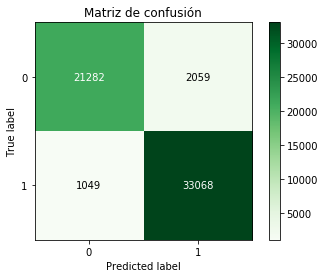

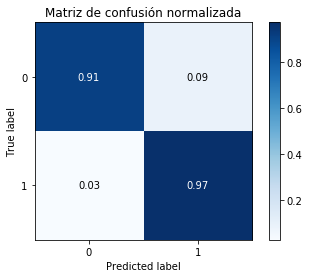

In [20]:
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
val_labels = test_gen.classes
val_labels.shape
matriz_confusion = confusion_matrix(val_labels, predictions.argmax(axis=1))
#print (matriz_confusion)

skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=False, title='Matriz de confusión',cmap=plt.cm.Greens)
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=True, title='Matriz de confusión normalizada')


In [21]:
from sklearn.metrics import classification_report

y_pred_binary = predictions.argmax(axis=1)
report = classification_report(test_gen.classes, y_pred_binary, target_names=['cancer','no_cancer'])
print("Obtención de métricas:\r\n")
print(report)

Obtención de métricas:

             precision    recall  f1-score   support

     cancer       0.95      0.91      0.93     23341
  no_cancer       0.94      0.97      0.96     34117

avg / total       0.95      0.95      0.95     57458



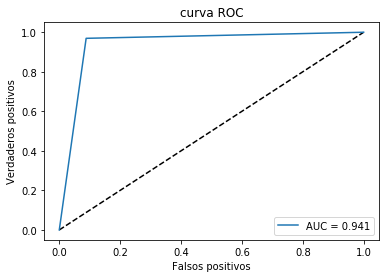

In [22]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
false_positive_rate, true_positive_rate, threshold = roc_curve(test_gen.classes, predictions.argmax(axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('Falsos positivos')
plt.ylabel('Verdaderos positivos')
plt.title('curva ROC')
plt.legend(loc='best')
plt.show()

In [23]:
np.save('predictions1.npy', predictions)    
predictions = np.load('predictions1.npy')
print(len(predictions))


57458


### Modelo 1 con ImageAugmentation (volver a llamar con crearModeloSecuencial)
Se comprueba si el uso de ImageAugmentation mejora los resultados, mediante el entrenamiento de una iteración

In [25]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
DROPOUT = 0.2

train_gen,val_gen=crearGeneradoresDA(BATCH_SIZE)

modelo1=crearModeloSecuencial(DROPOUT,'Adam')

history = modelo1.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    epochs=1, verbose=1, workers=4)

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
Epoch 1/1
1625/1625 [==============================] - 694s 427ms/step - loss: 0.6733 - acc: 0.5954 - val_loss: 0.6762 - val_acc: 0.5919


No se aprecian ventajas en usar ImageAugmentation en este modelo.

### Creación de modelo Residual basado en arquitectura ResNet
Se ha usado como referencia:

https://github.com/priya-dwivedi/Deep-Learning/blob/master/resnet_keras/Residual_Networks_yourself.ipynb
https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

In [30]:
def identity_block(X, f, filters, stage, block):
  
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    

    F1, F2, F3 = filters
    
    X_shortcut = X
    
   
    X = layers.Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a')(X)
    X = layers.BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = layers.Activation('relu')(X)

    X = layers.Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b')(X)
    X = layers.BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = layers.Activation('relu')(X)

    
    X = layers.Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c')(X)
    X = layers.BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)


    X = layers.Add()([X, X_shortcut])
    X = layers.Activation('relu')(X)
    
    
    return X

In [29]:
def convolutional_block(X, f, filters, stage, block, s = 2):    
    
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    F1, F2, F3 = filters
    
    
    X_shortcut = X

   
    X = layers.Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a')(X)
    X = layers.BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = layers.Activation('relu')(X)

    X = layers.Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b')(X)
    X = layers.BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = layers.Activation('relu')(X)


    X = layers.Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c')(X)
    X = layers.BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)


    # SHORTCUT 
    X_shortcut = layers.Conv2D(filters = F3, kernel_size = (1, 1), strides = (s,s), padding = 'valid', name = conv_name_base + '1')(X_shortcut)
    X_shortcut = layers.BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

   
    # Se añade el shortcut
    X = layers.Add()([X, X_shortcut])
    X = layers.Activation('relu')(X)
    
    
    return X

In [8]:
from keras.layers import Input
from keras.models import Model
from keras import optimizers

#Quitar el parámetro de dropout. NO se está utilizando
def crearModeloResNetBasedX(dropout=0.3,optimizerType='Adam'):   
        
    X_input = Input(shape=(96,96,3))
    
    # Zero-Padding
    X = layers.ZeroPadding2D((3, 3))(X_input)
       
        
    X = layers.Conv2D(32,(3,3),input_shape=(96,96,3))(X_input)   
    X = layers.BatchNormalization(axis=3, name='bn_conv1')(X)
    X = layers.Activation('relu')(X)
    X = layers.MaxPooling2D((3, 3), strides=(2, 2))(X)
   
    
    X = convolutional_block(X, f=3, filters=[32, 32, 64], stage=2, block='a', s=1)
    X = identity_block(X, 3, [32, 32, 64], stage=2, block='b')
    X = identity_block(X, 3, [32, 32, 64], stage=2, block='c')
    
    X = convolutional_block(X, f = 3, filters = [64, 64, 128], stage = 3, block='a', s = 2)
    X = identity_block(X, 3, [64, 64, 128], stage=3, block='b')
    X = identity_block(X, 3, [64, 64, 128], stage=3, block='c')
    X = identity_block(X, 3, [64, 64, 128], stage=3, block='d')

        
    X = convolutional_block(X, f = 3, filters = [128,128,256], stage = 4, block='a', s = 2)
    X = identity_block(X, 3, [128,128,256], stage=4, block='b')
    X = identity_block(X, 3, [128,128,256], stage=4, block='c') 
    
       

    # AVGPOOL (≈1 line). Use "X = AveragePooling2D(...)(X)"
    X = layers.AveragePooling2D((2,2), name="avg_pool")(X)
    
    
    X = layers.Flatten()(X)
    X = layers.Dense(2, activation='sigmoid')(X)
    
  

    model = Model(inputs=X_input, outputs= X)
    
    if optimizerType=='Adam':
        optimizer = optimizers.Adam(lr=0.0001)
    elif optimizerType=='SGD':
        optimizer = optimizers.SGD(lr=0.0001, momentum=0.9, nesterov=True)
    
    
    
    model.compile(optimizer=optimizer,
               loss='categorical_crossentropy',
               metrics=['accuracy'])  
    
              
    return model

In [9]:
BATCH_SIZE = 100 
train_gen,val_gen=crearGeneradores(BATCH_SIZE)

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.


In [10]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

DROPOUT = 0.3
modeloResX=crearModeloResNetBasedX(DROPOUT,'Adam')

Epoch 1/30
1625/1625 [==============================] - 3703s 2s/step - loss: 0.4078 - acc: 0.8215 - val_loss: 0.3683 - val_acc: 0.8460
Epoch 2/30
1625/1625 [==============================] - 3596s 2s/step - loss: 0.3352 - acc: 0.8577 - val_loss: 0.3201 - val_acc: 0.8785
Epoch 3/30
1625/1625 [==============================] - 3444s 2s/step - loss: 0.2858 - acc: 0.8823 - val_loss: 0.3442 - val_acc: 0.8585

Epoch 00003: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 4/30
1625/1625 [==============================] - 3483s 2s/step - loss: 0.2242 - acc: 0.9069 - val_loss: 0.2350 - val_acc: 0.9046
Epoch 5/30
1625/1625 [==============================] - 3449s 2s/step - loss: 0.2100 - acc: 0.9136 - val_loss: 0.2290 - val_acc: 0.9077
Epoch 6/30
1625/1625 [==============================] - 3430s 2s/step - loss: 0.2008 - acc: 0.9172 - val_loss: 0.2317 - val_acc: 0.9049

Epoch 00006: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
Epoch 7/30
1625/1625 [

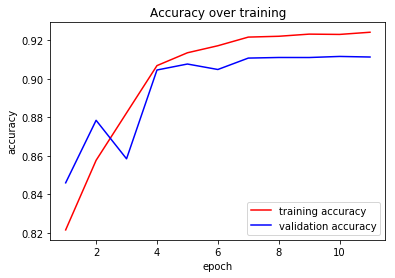

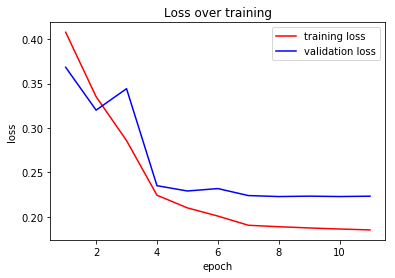

In [11]:
BATCH_SIZE = 100
earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('Modelo_ResX.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_ResX_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')

history = modeloResX.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=30, verbose=1, workers=4)

visualizarModelo(history)

Se aprecian unos resultados algo inferiores al modelo secuencial

In [7]:
modeloResX=load_model('Modelo_ResX.h5')
test_gen=crearGeneradorTest()

Found 57458 images belonging to 2 classes.


In [8]:
loss,accuracy = modeloResX.evaluate_generator(test_gen)
print('loss {} accuracy {}'.format(loss,accuracy))

loss 0.22322578066155724 accuracy 0.9108914337429078


In [9]:
modeloResX.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 96, 96, 3)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 94, 94, 32)   896         input_1[0][0]                    
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 94, 94, 32)   128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 94, 94, 32)   0           bn_conv1[0][0]                   
__________________________________________________________________________________________________
max_poolin

In [10]:
predictions = modeloResX.predict_generator(test_gen, steps=IMAGES_VAL, verbose=1)
print(len(predictions))

57458/57458 [==============================] - 5395s 94ms/step
57458


In [11]:
np.save('predictionsResX.npy', predictions) 

In [12]:
predictions.shape

(57458, 2)

In [13]:
test_gen.class_indices

{'cancer': 0, 'no_cancer': 1}

In [14]:
df_preds = pd.DataFrame(predictions, columns=['cancer', 'no_cancer'])
val_archivos = test_gen.filenames
print(len(df_preds))
df_preds['archivos'] = val_archivos
df_preds.head(5)

57458


,cancer,no_cancer,archivos
0,0.983619,0.043039,cancer/00001b2b5609af42ab0ab276dd4cd41c3e7745b...
1,0.969756,0.054314,cancer/0000da768d06b879e5754c43e2298ce48726f72...
2,0.668784,0.120184,cancer/00014e39b5df5f80df56f18a0a049d1cc6de430...
3,0.999993,0.013281,cancer/0001a2bc5d4aa55989f014bfad74a95ac3dfff5...
4,0.456840,0.124700,cancer/0002d959eecbd8d7f6614fdd513154e8e0e8e96...


In [15]:
from sklearn.metrics import roc_auc_score
roc_auc_score(test_gen.classes, df_preds['no_cancer'])

0.9375380002717659

In [17]:
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
val_labels = test_gen.classes
val_labels.shape
matriz_confusion = confusion_matrix(val_labels, predictions.argmax(axis=1))
print (matriz_confusion)

[[20816  2525]
 [ 2595 31522]]


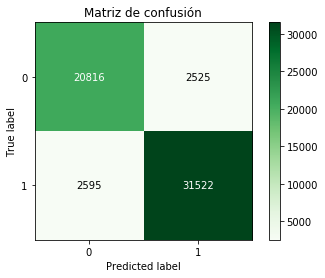

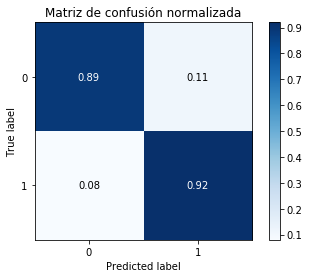

In [18]:
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=False, title='Matriz de confusión',cmap=plt.cm.Greens)
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=True, title='Matriz de confusión normalizada')

In [19]:
from sklearn.metrics import classification_report

y_pred_binary = predictions.argmax(axis=1)
report = classification_report(test_gen.classes, y_pred_binary, target_names=['cancer','no_cancer'])
print("Obtención de métricas:\r\n")
print(report)

Obtención de métricas:

             precision    recall  f1-score   support

     cancer       0.89      0.89      0.89     23341
  no_cancer       0.93      0.92      0.92     34117

avg / total       0.91      0.91      0.91     57458



In [20]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
false_positive_rate, true_positive_rate, threshold = roc_curve(test_gen.classes, predictions.argmax(axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)


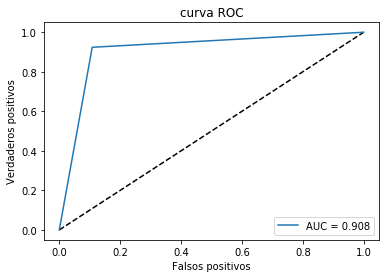

In [21]:
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('Falsos positivos')
plt.ylabel('Verdaderos positivos')
plt.title('curva ROC')
plt.legend(loc='best')
plt.show()


### Modificación del modelo

In [48]:
from keras.layers import Input
from keras.models import Model
from keras import optimizers
def crearModeloResNetBasedMod(dropout=0.3,optimizerType='Adam'):   
        
    X_input = Input(shape=(96,96,3))
    
    # Zero-Padding
    X = layers.ZeroPadding2D((3, 3))(X_input)
       
        
    X = layers.Conv2D(32,(3,3),input_shape=(96,96,3))(X_input)   
    X = layers.BatchNormalization(axis=3, name='bn_conv1')(X)
    X = layers.Activation('relu')(X)
    X = layers.MaxPooling2D((3, 3), strides=(2, 2))(X)
       
    
    X = convolutional_block(X, f=3, filters=[32, 32, 32], stage=2, block='a', s=1)   
    X = convolutional_block(X, f = 3, filters = [64, 64, 64], stage = 3, block='a', s = 2)        
    X = convolutional_block(X, f = 3, filters = [128,128,128], stage = 4, block='a', s = 2) 
    X = convolutional_block(X, f = 3, filters = [256,256,256], stage = 5, block='a', s = 2)

    # AVGPOOL (≈1 line). Use "X = AveragePooling2D(...)(X)"
    X = layers.AveragePooling2D((2,2), name="avg_pool")(X)
    
    
    x = layers.Dropout(dropout)
    X = layers.Flatten()(X)
    x = layers.Dense(64,activation='relu')
    x = layers.Dropout(dropout)
    X = layers.Dense(2, activation='sigmoid')(X)
    
  

    model = Model(inputs=X_input, outputs= X)
    
    if optimizerType=='Adam':
        optimizer = optimizers.Adam(lr=0.0001)
    elif optimizerType=='SGD':
        optimizer = optimizers.SGD(lr=0.0001, momentum=0.9, nesterov=True)
    
    
    
    model.compile(optimizer=optimizer,
               loss='categorical_crossentropy',
               metrics=['accuracy'])  
    
              
    return model

In [41]:
BATCH_SIZE = 100 
train_gen,val_gen=crearGeneradores(BATCH_SIZE)

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.


In [52]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

DROPOUT = 0.2
modeloResMod=crearModeloResNetBasedMod(DROPOUT,'Adam')

Epoch 1/30
1625/1625 [==============================] - 1827s 1s/step - loss: 0.3733 - acc: 0.8352 - val_loss: 0.3631 - val_acc: 0.8491
Epoch 2/30
1625/1625 [==============================] - 1838s 1s/step - loss: 0.2894 - acc: 0.8765 - val_loss: 0.2863 - val_acc: 0.8850
Epoch 3/30
1625/1625 [==============================] - 1841s 1s/step - loss: 0.2342 - acc: 0.9035 - val_loss: 0.3529 - val_acc: 0.8559

Epoch 00003: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 4/30
1625/1625 [==============================] - 1834s 1s/step - loss: 0.1688 - acc: 0.9337 - val_loss: 0.2336 - val_acc: 0.9082
Epoch 5/30
1625/1625 [==============================] - 1808s 1s/step - loss: 0.1545 - acc: 0.9406 - val_loss: 0.2331 - val_acc: 0.9105
Epoch 6/30
1625/1625 [==============================] - 1803s 1s/step - loss: 0.1464 - acc: 0.9445 - val_loss: 0.2374 - val_acc: 0.9083

Epoch 00006: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
Epoch 7/30
1625/1625 [

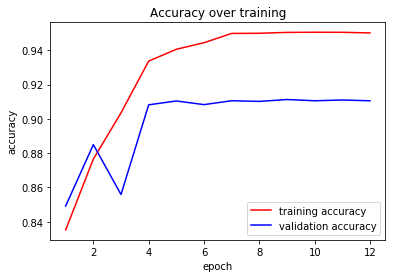

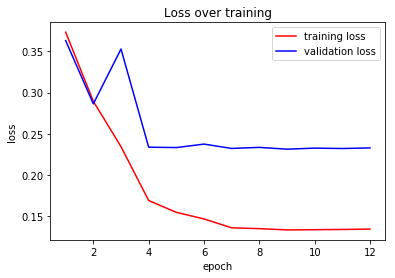

In [53]:
BATCH_SIZE = 100
earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('modeloResMod.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('modeloResMod_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')

history = modeloResMod.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=30, verbose=1, workers=4)

visualizarModelo(history)

### Creación de modelo haciendo uso de ResNet50 (fine-tunning)

In [10]:
from keras.applications import ResNet50

resnet = ResNet50(weights='imagenet',
                 include_top=False,input_shape=(96,96,3)) 
                 
resnet.summary()

/home/g404isabel/anaconda3/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 96, 96, 3)    0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 102, 102, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 48, 48, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 48, 48, 64)   256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [72]:
from keras.applications import ResNet50
from keras.applications import VGG16, VGG19
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input
from keras.models import Model
from keras import optimizers


def crearModeloResNet(learning_rate,dropout):
    
    
    
    conv_base = ResNet50(weights='imagenet',include_top=False, input_shape=(96,96,3)) 
    conv_base.Trainable = False                  
#Se entrenan las primeras capas, pero no se obtienen buenos resultados
#for layer in conv_base.layers[:capasCongeladas]: #Congelo las 'n' primeras capas
#      layer.trainable = False
    
    #conv_base.Trainable=True
    #set_trainable=False
    #for layer in conv_base.layers:
    #    if layer.name == 'res5a_branch2a':
    #        set_trainable = True
    #    if set_trainable:
    #        layer.trainable = True
   #     else:
   #         layer.trainable = False

    model = models.Sequential()
    model.add(conv_base)
    model.add(layers.Flatten())
    model.add(layers.Dense(256, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation("relu"))
    model.add(layers.Dropout(dropout))
    model.add(layers.Dense(2, activation = "sigmoid"))
    
       
    optimizer = optimizers.Adam(lr=learning_rate)  
    model.compile(optimizer=optimizer,
               loss='binary_crossentropy',
               metrics=['accuracy'])  
    
              
    return model 
    #Congelando todas las capas se obtienen malos resultados
    #El las dos primeras epochs, train obtiene valores entre 0.8 y 0.9, mientras que en validation se obtienen
    #resultados muy pobres. Por ello, se prueba a ir congelando y descongelando distintas capas.
    #Dropout 0.2 --> 0.5
    #Dropout 0.3 --> 0.4
    #Sin dropout --> no tenía buena pinta
    #Dropout 0.5 --> 0.5940 , 0.5938

#### Entrenamiento de la red neuronal

In [ ]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
LEARNING_RATE = 0.001
DROPOUT = 0.5

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

modelo3=crearModeloResNet(LEARNING_RATE,DROPOUT)


earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('Modelo_3.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_3_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')
#Se guarde el history porque no es posible entrenar el modelo de una sóla vez (el kernel se reinicia de manera aleatoria)
#history_checkpoint = LossHistory()

history = modelo3.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=10, verbose=1, workers=4)


visualizarModelo(history)       

#modelo3.save('Modelo_3.h5') 

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.


/home/g404isabel/anaconda3/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Epoch 1/10
1625/1625 [==============================] - 4971s 3s/step - loss: 0.2794 - acc: 0.8897 - val_loss: 0.2877 - val_acc: 0.9010
Epoch 2/10
1625/1625 [==============================] - 4965s 3s/step - loss: 0.1893 - acc: 0.9283 - val_loss: 0.3880 - val_acc: 0.8729

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Epoch 3/10
1625/1625 [==============================] - 5019s 3s/step - loss: 0.1219 - acc: 0.9564 - val_loss: 0.1785 - val_acc: 0.9372
Epoch 4/10
1625/1625 [==============================] - 4931s 3s/step - loss: 0.1018 - acc: 0.9640 - val_loss: 0.1329 - val_acc: 0.9539
Epoch 5/10
1625/1625 [==============================] - 4967s 3s/step - loss: 0.0864 - acc: 0.9699 - val_loss: 0.1194 - val_acc: 0.9579
Epoch 6/10
1625/1625 [==============================] - 5111s 3s/step - loss: 0.0704 - acc: 0.9757 - val_loss: 0.1351 - val_acc: 0.9562

Epoch 00006: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
Epoch 7/10
  54/1625

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
Epoch 1/10
1625/1625 [==============================] - 5188s 3s/step - loss: 0.0476 - acc: 0.9845 - val_loss: 0.1243 - val_acc: 0.9611
Epoch 2/10
1625/1625 [==============================] - 5063s 3s/step - loss: 0.0436 - acc: 0.9862 - val_loss: 0.1274 - val_acc: 0.9613

Epoch 00002: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
Epoch 3/10
1625/1625 [==============================] - 5073s 3s/step - loss: 0.0404 - acc: 0.9875 - val_loss: 0.1281 - val_acc: 0.9609

Epoch 00003: ReduceLROnPlateau reducing learning rate to 1.0000001111620805e-07.
Epoch 4/10
1625/1625 [==============================] - 5064s 3s/step - loss: 0.0396 - acc: 0.9876 - val_loss: 0.1279 - val_acc: 0.9610

Epoch 00004: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-08.
Restoring model weights from the end of the best epoch
Epoch 00004: early stopping


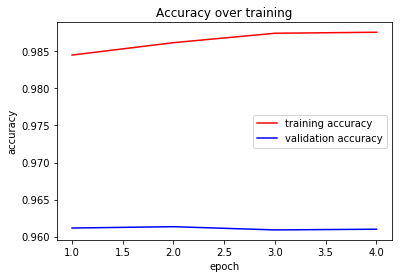

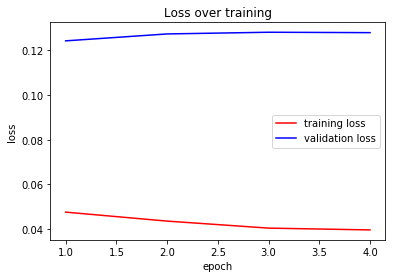

In [15]:
from keras.models import load_model

from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

#Se carga el último modelo y se sigue entrenando a partir de ese punto
modelo3 = load_model('Modelo_3_tmp.h5')

earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Se guarda, sólo si es el mejor modelo Modelo_3_1
mcp_save = ModelCheckpoint('Modelo_3.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_3_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')
#Se guarde el history porque no es posible entrenar el modelo de una sóla vez (el kernel se reinicia de manera aleatoria)
#history_checkpoint = LossHistory()

history = modelo3.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=10, verbose=1, workers=4)


#visualizarModelo(history)     


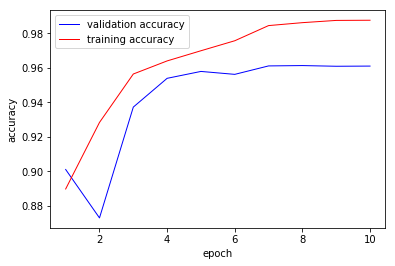

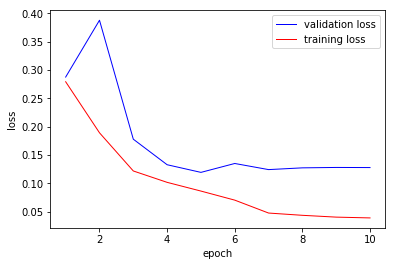

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
fig,axis = plt.subplots(1,1)

validationAcc=[0.9010,0.8729,0.9372, 0.9539, 0.9579,0.9562,0.9611,0.9613,0.9609, 0.9610] #Datos del eje y para validation accuracy
trainingAcc=[0.8897, 0.9283,0.9564, 0.9640, 0.9699, 0.9757, 0.9845,0.9862,0.9875, 0.9876] #Datos del eje y para training accuracy

lista=list(range(1,11)) #Datos para los ejes x
axis.plot(lista,validationAcc,'b-',label='validation accuracy',linewidth=1) 
axis.plot(lista,trainingAcc,'r',label='training accuracy',linewidth=1) 
axis.legend(loc='best') 
axis.set_xlabel('epoch')
axis.set_ylabel('accuracy')
plt.show() 


fig2,axis2 = plt.subplots(1,1)
validationLoss=[0.2877,0.388,0.178,0.1329,0.1194,0.1351,0.1243,0.1274,0.1281, 0.1279]
trainingLoss=[0.2794,0.1893,0.1219,0.1018, 0.0864,0.0704,0.0476, 0.0436,0.0404,0.039]
axis2.plot(lista,validationLoss,'b-',label='validation loss',linewidth=1) 
axis2.plot(lista,trainingLoss,'r',label='training loss',linewidth=1) 
axis2.legend(loc='best') 
axis2.set_xlabel('epoch')
axis2.set_ylabel('loss')
plt.show()

In [42]:
modelo3=load_model('Modelo_3.h5')

In [17]:
modelo3=load_model('Modelo_3.h5')
loss,accuracy = modelo3.evaluate_generator(val_gen)
print('loss {} accuracy {}'.format(loss,accuracy))

loss 0.12429445247479692 accuracy 0.9611716430262496


In [114]:
datagen = ImageDataGenerator(rescale=1.0/255)
val_gen_pred = datagen.flow_from_directory('val',
                                            target_size=(96,96),
                                            batch_size=1,
                                            class_mode='categorical',
                                            shuffle=False) #Para que no se desordene

predictions = modelo3.predict_generator(val_gen_pred, steps=IMAGES_VAL, verbose=1)
print(len(predictions))

Found 57458 images belonging to 2 classes.
57458/57458 [==============================] - 11788s 205ms/step
57458


In [106]:
predictions.shape

(575, 2)

In [89]:
val_gen_pred.class_indices

{'cancer': 0, 'no_cancer': 1}

In [115]:
df_preds = pd.DataFrame(predictions, columns=['cancer', 'no_cancer'])
#print(df_preds.head())
val_archivos = val_gen_pred.filenames
print(len(df_preds))
#print(len(val_archivos))
df_preds['archivos'] = val_archivos
df_preds.head(20)

57458


,cancer,no_cancer,archivos
0,0.999999,0.000001,cancer/00001b2b5609af42ab0ab276dd4cd41c3e7745b...
1,0.533817,0.463042,cancer/0000da768d06b879e5754c43e2298ce48726f72...
2,0.999971,0.000035,cancer/00014e39b5df5f80df56f18a0a049d1cc6de430...
3,0.993951,0.005758,cancer/0001a2bc5d4aa55989f014bfad74a95ac3dfff5...
4,0.993994,0.006157,cancer/0002d959eecbd8d7f6614fdd513154e8e0e8e96...
5,0.981490,0.018462,cancer/0004d129ba4596aa6bb2730dc453135fb40528d...
6,0.999933,0.000069,cancer/0004d8e4a43d935b2d799d4339dd4e8448d1a59...
7,0.998862,0.001132,cancer/0007e4f8f2e61aa10a7cdb647e8ed346a9b4398...
8,0.992482,0.006927,cancer/000a2a35668f04edebc0b06d5d133ad90c93a04...
9,0.988334,0.011826,cancer/000aa5d8f68dc1f45ebba53b8f159aae80e0607...


In [116]:
print(val_gen_pred.classes[:5])

[0 0 0 0 0]


In [126]:
from sklearn.metrics import roc_auc_score
roc_auc_score(val_gen_pred.classes, df_preds['no_cancer'])

0.9910209456882022

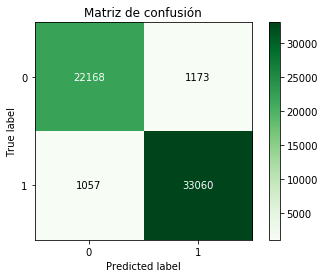

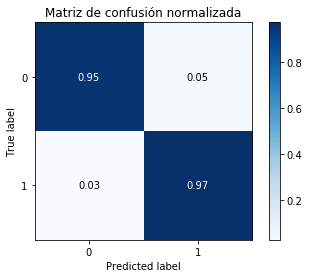

In [154]:
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
val_labels = val_gen_pred.classes
val_labels.shape
matriz_confusion = confusion_matrix(val_labels, predictions.argmax(axis=1))
#print (matriz_confusion)

skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=False, title='Matriz de confusión',cmap=plt.cm.Greens)
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=True, title='Matriz de confusión normalizada')


In [153]:
from sklearn.metrics import classification_report

y_pred_binary = predictions.argmax(axis=1)
report = classification_report(val_gen_pred.classes, y_pred_binary, target_names=['cancer','no_cancer'])
print("Obtención de métricas:\r\n")
print(report)

Obtención de métricas:

             precision    recall  f1-score   support

     cancer       0.95      0.95      0.95     23341
  no_cancer       0.97      0.97      0.97     34117

avg / total       0.96      0.96      0.96     57458



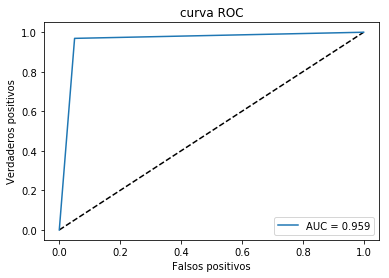

In [132]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
false_positive_rate, true_positive_rate, threshold = roc_curve(val_gen_pred.classes, predictions.argmax(axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('Falsos positivos')
plt.ylabel('Verdaderos positivos')
plt.title('curva ROC')
plt.legend(loc='best')
plt.show()

In [147]:
np.save('predictions3.npy', predictions)    
predictions3 = np.load('predictions3.npy')

print(len(predictions))
print(len(predictions3))


57458
57458


#### VGG16

In [8]:
from keras.applications import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input
from keras.models import Model
from keras import optimizers



def crearModeloVGG16(learning_rate,dropout):
    
    conv_base = VGG16(weights='imagenet',include_top=False, input_shape=(96,96,3))   
                      
    conv_base.Trainable = False         
    model = models.Sequential()
    model.add(conv_base)
    model.add(layers.Flatten())
    model.add(layers.Dense(256, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation("relu"))
    model.add(layers.Dropout(dropout))
    model.add(layers.Dense(2, activation = "sigmoid"))
  
    optimizer = optimizers.Adam(lr=learning_rate)  
    model.compile(optimizer=optimizer,
               loss='binary_crossentropy',
               metrics=['accuracy'])  
    
              
    return model 
   

In [ ]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
LEARNING_RATE = 0.001
DROPOUT = 0.5

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

modelo4=crearModeloVGG16(LEARNING_RATE,DROPOUT)


earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('Modelo_4.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_4_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')
#Se guarde el history porque no es posible entrenar el modelo de una sóla vez (el kernel se reinicia de manera aleatoria)
#history_checkpoint = LossHistory()

history = modelo4.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=10, verbose=1, workers=4)


#visualizarModelo(history)     

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
Epoch 1/10
1625/1625 [==============================] - 6233s 4s/step - loss: 0.4581 - acc: 0.7898 - val_loss: 0.4490 - val_acc: 0.8159
Epoch 2/10
1625/1625 [==============================] - 6212s 4s/step - loss: 0.3361 - acc: 0.8583 - val_loss: 0.5082 - val_acc: 0.8084

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Epoch 3/10
1625/1625 [==============================] - 6193s 4s/step - loss: 0.2322 - acc: 0.9078 - val_loss: 0.2055 - val_acc: 0.9200
Epoch 4/10
1342/1625 [=======================>......] - ETA: 16:18 - loss: 0.1989 - acc: 0.9232

#### Segunda fase del entrenamiento donde se quedó

In [ ]:
from keras.models import load_model

from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

#Se carga el último modelo y se sigue entrenando a partir_ de ese punto
modelo4 = load_model('Modelo_4_tmp.h5')

earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Se guarda, sólo si es el mejor modelo Modelo_4_1
mcp_save = ModelCheckpoint('Modelo_4_2.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_4_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')
#Se guarde el history porque no es posible entrenar el modelo de una sóla vez (el kernel se reinicia de manera aleatoria)
#history_checkpoint = LossHistory()

history = modelo4.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmpl],            
                    epochs=10, verbose=1, workers=4)

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
Epoch 1/10
1625/1625 [==============================] - 6246s 4s/step - loss: 0.1990 - acc: 0.9242 - val_loss: 0.2797 - val_acc: 0.8840
Epoch 2/10
1625/1625 [==============================] - 6166s 4s/step - loss: 0.1736 - acc: 0.9344 - val_loss: 0.1712 - val_acc: 0.9353
Epoch 3/10
1625/1625 [==============================] - 6209s 4s/step - loss: 0.1583 - acc: 0.9408 - val_loss: 0.1857 - val_acc: 0.9287

Epoch 00003: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
Epoch 4/10
1625/1625 [==============================] - 6185s 4s/step - loss: 0.1382 - acc: 0.9492 - val_loss: 0.1509 - val_acc: 0.9444
Epoch 5/10
1625/1625 [==============================] - 6206s 4s/step - loss: 0.1354 - acc: 0.9505 - val_loss: 0.1510 - val_acc: 0.9437

Epoch 00005: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
Epoch 6/10
1625/1625 [==============================] - 6199s 4s/step

#### Tercera iteración

In [9]:
from keras.models import load_model

from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

#Se carga el último modelo y se sigue entrenando a partir de ese punto
modelo4 = load_model('Modelo_4_tmp.h5')

earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Se guarda, sólo si es el mejor modelo Modelo_4_1
mcp_save = ModelCheckpoint('Modelo_4_3.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_4_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')
#Se guarde el history porque no es posible entrenar el modelo de una sóla vez (el kernel se reinicia de manera aleatoria)
#history_checkpoint = LossHistory()

history = modelo4.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=3, verbose=1, workers=4)

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.
Epoch 1/3
1625/1625 [==============================] - 6045s 4s/step - loss: 0.1337 - acc: 0.9512 - val_loss: 0.1457 - val_acc: 0.9464
Epoch 2/3
1625/1625 [==============================] - 6098s 4s/step - loss: 0.1317 - acc: 0.9518 - val_loss: 0.1463 - val_acc: 0.9463

Epoch 00002: ReduceLROnPlateau reducing learning rate to 1.0000001111620805e-07.
Epoch 3/3
1625/1625 [==============================] - 6133s 4s/step - loss: 0.1312 - acc: 0.9518 - val_loss: 0.1457 - val_acc: 0.9460

Epoch 00003: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-08.


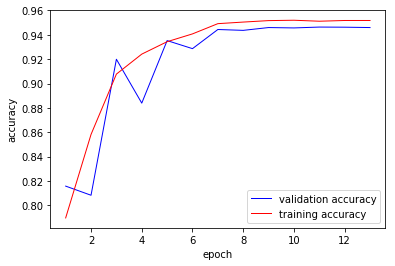

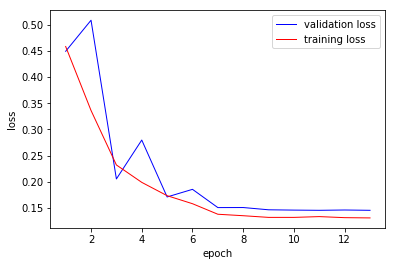

In [137]:
import matplotlib.pyplot as plt
%matplotlib inline
fig,axis = plt.subplots(1,1)

validationAcc=[0.8159,0.8084,0.9200,0.8840,0.9353,0.9287,0.9444,0.9437,0.9460,0.9457,0.9464,0.9463,0.9460] #Datos del eje y para validation accuracy
trainingAcc=[0.7898,0.8583,0.9078,0.9242,0.9344,0.9408,0.9492,0.9505,0.9517,0.9520,0.9512,0.9518,0.9518] #Datos del eje y para training accuracy

lista=list(range(1,14)) #Datos para los ejes x
axis.plot(lista,validationAcc,'b-',label='validation accuracy',linewidth=1) 
axis.plot(lista,trainingAcc,'r',label='training accuracy',linewidth=1) 
axis.legend(loc='best') 
axis.set_xlabel('epoch')
axis.set_ylabel('accuracy')
plt.show() 


fig2,axis2 = plt.subplots(1,1)
validationLoss=[0.4490,0.5082,0.2055,0.2797,0.1712,0.1857,0.1509,0.1510,0.1467,0.1461,0.1457,0.1463,0.1457]
trainingLoss=[0.4581,0.3361,0.2322,0.1990,0.1736,0.1583,0.1382,0.1354,0.1322,0.1322,0.1337,0.1317,0.1312]
axis2.plot(lista,validationLoss,'b-',label='validation loss',linewidth=1) 
axis2.plot(lista,trainingLoss,'r',label='training loss',linewidth=1) 
axis2.legend(loc='best') 
axis2.set_xlabel('epoch')
axis2.set_ylabel('loss')
plt.show()

In [8]:
test_gen=crearGeneradorTest()
modelo4=load_model('Modelo_4_3.h5')
loss,accuracy = modelo4.evaluate_generator(test_gen)
print('loss {} accuracy {}'.format(loss,accuracy))

Found 57458 images belonging to 2 classes.
loss 0.14567854437308725 accuracy 0.9459083156392495


In [138]:
modelo4=load_model('Modelo_4_3.h5')

In [139]:
modelo4.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 3, 3, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 4608)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               1179648   
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 514       
Total para

In [9]:
predictions = modelo4.predict_generator(test_gen, steps=IMAGES_VAL, verbose=1)
print(len(predictions))

57458/57458 [==============================] - 1628s 28ms/step
57458


In [10]:
predictions.shape

(57458, 2)

In [11]:
test_gen.class_indices

{'cancer': 0, 'no_cancer': 1}

In [12]:
df_preds = pd.DataFrame(predictions, columns=['cancer', 'no_cancer'])
val_archivos = test_gen.filenames
print(len(df_preds))
df_preds['archivos'] = val_archivos
df_preds.head(5)

57458


,cancer,no_cancer,archivos
0,0.999793,0.000206,cancer/00001b2b5609af42ab0ab276dd4cd41c3e7745b...
1,0.825488,0.175709,cancer/0000da768d06b879e5754c43e2298ce48726f72...
2,0.995925,0.004102,cancer/00014e39b5df5f80df56f18a0a049d1cc6de430...
3,0.982557,0.017610,cancer/0001a2bc5d4aa55989f014bfad74a95ac3dfff5...
4,0.954140,0.046164,cancer/0002d959eecbd8d7f6614fdd513154e8e0e8e96...


In [13]:
from sklearn.metrics import roc_auc_score
roc_auc_score(test_gen.classes, df_preds['no_cancer'])

0.9854975399569856

In [14]:
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
val_labels = test_gen.classes
val_labels.shape
matriz_confusion = confusion_matrix(val_labels, predictions.argmax(axis=1))

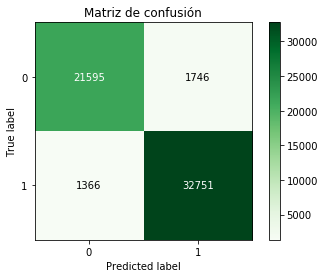

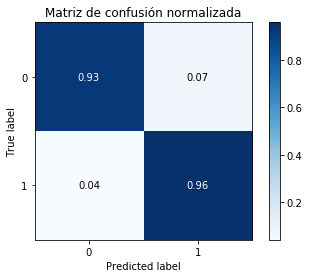

In [15]:
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=False, title='Matriz de confusión',cmap=plt.cm.Greens)
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=True, title='Matriz de confusión normalizada')

In [16]:
from sklearn.metrics import classification_report

y_pred_binary = predictions.argmax(axis=1)
report = classification_report(test_gen.classes, y_pred_binary, target_names=['cancer','no_cancer'])
print("Obtención de métricas:\r\n")
print(report)

Obtención de métricas:

             precision    recall  f1-score   support

     cancer       0.94      0.93      0.93     23341
  no_cancer       0.95      0.96      0.95     34117

avg / total       0.95      0.95      0.95     57458



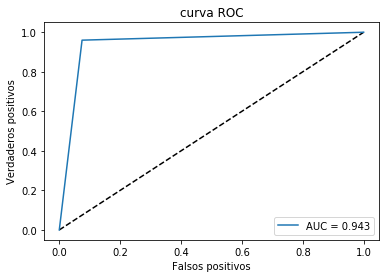

In [17]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
false_positive_rate, true_positive_rate, threshold = roc_curve(test_gen.classes, predictions.argmax(axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

plt.plot([0, 1], [0, 1], 'k--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('Falsos positivos')
plt.ylabel('Verdaderos positivos')
plt.title('curva ROC')
plt.legend(loc='best')
plt.show()

In [18]:
np.save('predictions4.npy', predictions)    
predictions = np.load('predictions4.npy')

print(len(predictions))

57458


### Combinación de modelos (tarda 3 horas cada epoch) Peor que usando ResNet sólo en validation (aunque en train da mejores resultados)

In [ ]:
train_gen,val_gen=crearGeneradores(BATCH_SIZE)

In [132]:
from keras.applications import ResNet50, VGG16
from keras.layers import Input
from keras.models import Model
from keras import optimizers
from keras.layers import Concatenate, concatenate


def crearModelosCombinados(learning_rate,dropout):
    
    input_shape = (96,96,3)
    inputs = Input(input_shape)    
    resnet = ResNet50(weights='imagenet',include_top=False, input_shape=(96,96,3))(inputs)
    resnet.Trainable = False
    vgg16 = VGG16(weights='imagenet',include_top=False, input_shape=(96,96,3))(inputs)
    vgg16.Trainable = False
    
    outputs = concatenate([resnet,vgg16])
    outputs = layers.Flatten()(outputs)
    outputs = layers.Dense(256, use_bias=False)(outputs)  
    outputs = layers.BatchNormalization()(outputs)
    outputs = layers.Activation("relu")(outputs)              
    outputs = layers.Dropout(dropout)(outputs)      
    outputs = layers.Dense(2, activation = "sigmoid")(outputs)              
     
    model = Model(inputs, outputs)
    
    optimizer = optimizers.Adam(lr=learning_rate)  
    model.compile(optimizer=optimizer,
               loss='binary_crossentropy',
               metrics=['accuracy'])  
    
                  
              
    return model 
   

In [134]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
LEARNING_RATE = 0.001
DROPOUT = 0.5

train_gen,val_gen=crearGeneradores(BATCH_SIZE)

modeloComb=crearModelosCombinados(LEARNING_RATE,DROPOUT)

history = modeloComb.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,                               
                    epochs=1, verbose=1, workers=4)

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.


/home/g404tests/anaconda3/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Epoch 1/1
1625/1625 [==============================] - 10830s 7s/step - loss: 0.2302 - acc: 0.9098 - val_loss: 0.3330 - val_acc: 0.8708


## ResNet con tamaño de la imágen 224,224 (original de ImageNet)

In [10]:
from keras.applications import ResNet50
from keras.layers import Input
from keras.models import Model
from keras import optimizers

def crearGeneradoresRM(batch_size):
    datagen = ImageDataGenerator(rescale=1.0/255) #Se aplica normalización
    
    train_gen = datagen.flow_from_directory('train',
                                            target_size=(224,224), #En ResNet se ha entrenado con imágenes de 224,224
                                            batch_size=batch_size,
                                            class_mode='categorical')
    val_gen = datagen.flow_from_directory('val',
                                                target_size=(224,224),
                                            batch_size=batch_size,
                                            class_mode='categorical')
    return train_gen, val_gen

def crearGeneradoresRMTest():
    datagen = ImageDataGenerator(rescale=1.0/255) #Se aplica normalización
    test_gen = datagen.flow_from_directory('val',
                                            target_size=(224,224),
                                            batch_size=1,
                                            class_mode='categorical',
                                            shuffle=False)
    return test_gen


def crearModeloResNetMod(learning_rate,dropout):
    
    conv_base = ResNet50(weights='imagenet',include_top=False, input_shape=(224,224,3)) 
    conv_base.Trainable = False   

    model = models.Sequential()
    model.add(conv_base)
    model.add(layers.Flatten())
    model.add(layers.Dense(256, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation("relu"))
    model.add(layers.Dropout(dropout))
    model.add(layers.Dense(2, activation = "sigmoid"))
    
        
    optimizer = optimizers.Adam(lr=learning_rate)  
    model.compile(optimizer=optimizer,
               loss='binary_crossentropy',
               metrics=['accuracy'])  
    
              
    return model 

### Un sólo epoch para comprobar métricas en entrenamiento y validación

In [28]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
LEARNING_RATE = 0.001
DROPOUT = 0.5

train_gen,val_gen=crearGeneradoresRM(BATCH_SIZE)

modelo5=crearModeloResNetMod(LEARNING_RATE,DROPOUT)


earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('Modelo_6.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_6_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')
#Se guarde el history porque no es posible entrenar el modelo de una sóla vez (el kernel se reinicia de manera aleatoria)
#history_checkpoint = LossHistory()

history = modelo5.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=1, verbose=1, workers=4)


#visualizarModelo(history)       

Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.


/home/g404tests/anaconda3/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Epoch 1/1
1625/1625 [==============================] - 23840s 15s/step - loss: 0.2492 - acc: 0.9022 - val_loss: 0.2453 - val_acc: 0.9060


En un primer epoch, se ven resultados ligeramente mejores pero ha tardado 6 horas, mucho más que en el modelo inicial dejando
el tamaño intacto el tamaño original de las imágenes.

#### Como se observan buenos resultados, se procede al entrenamiento del modelo. Se empieza con learning-rate de 0.0001 (se ha observado mejores resultados con este valor en modelos previos) en esta ocasión para tratar de minimizar el número de epochs, dado que cada iteración tarda alrededor de 5 horas. (Subiendo de 18vcpus y 60gb ram a 20 vcpus y 75 gb, se pasa de 6 a 5 horas)

In [7]:
from keras.layers import Input, GlobalMaxPooling2D, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
BATCH_SIZE = 100 
LEARNING_RATE = 0.0001 #Suele dar mejores resultados. Empiezo con este valor para tratar de reducir iteraciones.
DROPOUT = 0.5

train_gen,val_gen=crearGeneradoresRM(BATCH_SIZE)

modelo5=crearModeloResNetMod(LEARNING_RATE,DROPOUT)


earlystopper = EarlyStopping(monitor='val_loss', patience=3, verbose=2, restore_best_weights=True)
reduce = ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1)
#Mejor modelo
mcp_save = ModelCheckpoint('Modelo_6.h5', save_best_only=True, monitor='val_loss', mode='min')
#Modelo guardado en cada epoch (dado que el kernel se reinicia a cada tanto)
mcp_save_tmp = ModelCheckpoint('Modelo_6_tmp.h5', save_best_only=False, monitor='val_loss', mode='min')
#Se guarde el history porque no es posible entrenar el modelo de una sóla vez (el kernel se reinicia de manera aleatoria)
#history_checkpoint = LossHistory()

history = modelo5.fit_generator(train_gen, steps_per_epoch=IMAGES_TRAIN//BATCH_SIZE, 
                    validation_data=val_gen,
                    validation_steps=IMAGES_VAL//BATCH_SIZE,
                    callbacks = [reduce, earlystopper, mcp_save, mcp_save_tmp],            
                    epochs=10, verbose=1, workers=4)


Found 162567 images belonging to 2 classes.
Found 57458 images belonging to 2 classes.


/home/g404tests/anaconda3/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


Epoch 1/10
1625/1625 [==============================] - 21160s 13s/step - loss: 0.1620 - acc: 0.9396 - val_loss: 0.1137 - val_acc: 0.9610
Epoch 2/10
1625/1625 [==============================] - 20678s 13s/step - loss: 0.0872 - acc: 0.9697 - val_loss: 0.1355 - val_acc: 0.9516

Epoch 00002: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
Epoch 3/10
1625/1625 [==============================] - 20710s 13s/step - loss: 0.0301 - acc: 0.9907 - val_loss: 0.0787 - val_acc: 0.9754
Epoch 4/10
1625/1625 [==============================] - 20834s 13s/step - loss: 0.0137 - acc: 0.9964 - val_loss: 0.0823 - val_acc: 0.9766

Epoch 00004: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
Epoch 5/10
1625/1625 [==============================] - 20892s 13s/step - loss: 0.0073 - acc: 0.9986 - val_loss: 0.0810 - val_acc: 0.9768

Epoch 00005: ReduceLROnPlateau reducing learning rate to 9.999999974752428e-08.
Epoch 6/10
1625/1625 [==============================] - 20984s 13s/

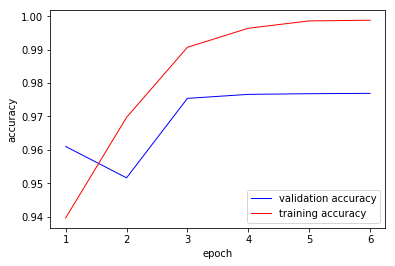

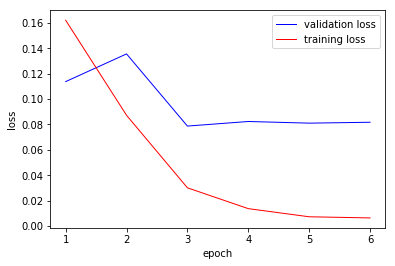

In [13]:
import matplotlib.pyplot as plt
%matplotlib inline
fig,axis = plt.subplots(1,1)

validationAcc=[0.9610,0.9516,0.9754, 0.9766, 0.9768,0.9769] #Datos del eje y para validation accuracy
trainingAcc=[0.9396, 0.9697,0.9907, 0.9964, 0.9986, 0.9988] #Datos del eje y para training accuracy

lista=list(range(1,7)) #Datos para los ejes x
axis.plot(lista,validationAcc,'b-',label='validation accuracy',linewidth=1) 
axis.plot(lista,trainingAcc,'r',label='training accuracy',linewidth=1) 
axis.legend(loc='best') 
axis.set_xlabel('epoch')
axis.set_ylabel('accuracy')
plt.show() 


fig2,axis2 = plt.subplots(1,1)
validationLoss=[0.1137,0.1355,0.0787,0.0823,0.0810,0.0817]
trainingLoss=[0.1620,0.0872,0.0301, 0.0137, 0.0073, 0.0064]
axis2.plot(lista,validationLoss,'b-',label='validation loss',linewidth=1) 
axis2.plot(lista,trainingLoss,'r',label='training loss',linewidth=1) 
axis2.legend(loc='best') 
axis2.set_xlabel('epoch')
axis2.set_ylabel('loss')
plt.show()

In [11]:
test_gen=crearGeneradoresRMTest()

Found 57458 images belonging to 2 classes.


In [7]:
modelo6=load_model('Modelo_6.h5')
loss,accuracy = modelo6.evaluate_generator(test_gen)
print('loss {} accuracy {}'.format(loss,accuracy))

Found 57458 images belonging to 2 classes.
loss 0.07874322385535551 accuracy 0.9754342302203348


In [140]:
modelo6=load_model('Modelo_6.h5')
modelo6.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 7, 7, 2048)        23587712  
_________________________________________________________________
flatten_1 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               25690112  
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
activation_50 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 514       
Total para

In [8]:
predictions = modelo6.predict_generator(test_gen, steps=IMAGES_VAL, verbose=1)
print(len(predictions))

57458/57458 [==============================] - 13373s 233ms/step
57458


In [9]:
predictions.shape

(57458, 2)

In [10]:
np.save('predictions6.npy', predictions)    

In [7]:
predictions=np.load('predictions6.npy')

In [12]:
test_gen.class_indices

{'cancer': 0, 'no_cancer': 1}

In [76]:
df_preds = pd.DataFrame(predictions, columns=['cancer', 'no_cancer'])
val_archivos = test_gen.filenames
print(len(df_preds))
df_preds['archivos'] = val_archivos
df_preds.head(5)

57458


,cancer,no_cancer,archivos
0,0.999716,0.000335,cancer/00001b2b5609af42ab0ab276dd4cd41c3e7745b...
1,0.999978,0.000026,cancer/0000da768d06b879e5754c43e2298ce48726f72...
2,0.999993,0.000005,cancer/00014e39b5df5f80df56f18a0a049d1cc6de430...
3,0.995166,0.005544,cancer/0001a2bc5d4aa55989f014bfad74a95ac3dfff5...
4,0.998536,0.002386,cancer/0002d959eecbd8d7f6614fdd513154e8e0e8e96...


In [13]:
from sklearn.metrics import roc_auc_score
roc_auc_score(test_gen.classes, df_preds['no_cancer'])

0.9954105899316118

In [14]:
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
val_labels = test_gen.classes
val_labels.shape
matriz_confusion = confusion_matrix(val_labels, predictions.argmax(axis=1))

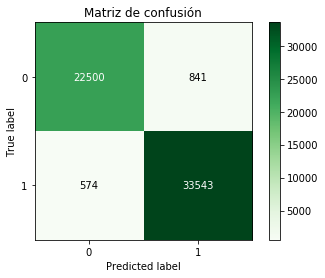

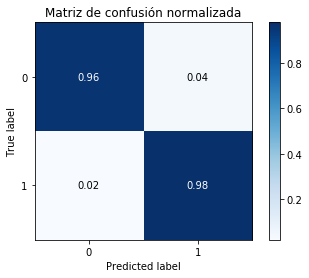

In [15]:
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=False, title='Matriz de confusión',cmap=plt.cm.Greens)
skplt.metrics.plot_confusion_matrix(val_labels, predictions.argmax(axis=1), normalize=True, title='Matriz de confusión normalizada')

In [16]:
from sklearn.metrics import classification_report
y_pred_binary = predictions.argmax(axis=1)
report = classification_report(test_gen.classes, y_pred_binary, target_names=['cancer','no_cancer'])
print("Obtención de métricas:\r\n")
print(report)

Obtención de métricas:

             precision    recall  f1-score   support

     cancer       0.98      0.96      0.97     23341
  no_cancer       0.98      0.98      0.98     34117

avg / total       0.98      0.98      0.98     57458



In [17]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
false_positive_rate, true_positive_rate, threshold = roc_curve(test_gen.classes, predictions.argmax(axis=1))
area_under_curve = auc(false_positive_rate, true_positive_rate)

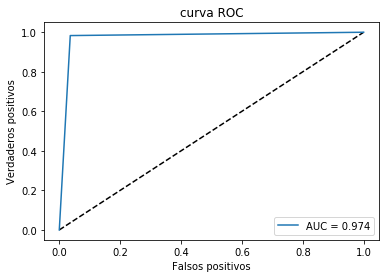

In [18]:
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(false_positive_rate, true_positive_rate, label='AUC = {:.3f}'.format(area_under_curve))
plt.xlabel('Falsos positivos')
plt.ylabel('Verdaderos positivos')
plt.title('curva ROC')
plt.legend(loc='best')
plt.show()

#### Falsos negativos

In [97]:
#Obtener falsos negativos
mask=df_preds['no_cancer']>df_preds['cancer']
dfFN=df_preds[mask]
mask2=(df_preds['archivos'].str.slice(0, 1)=='c')
dfFN=dfFN[mask2]
print(len(dfFN))
dfFN.head(10)

841


/home/g404tests/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


,cancer,no_cancer,archivos
36,0.001735,0.998074,cancer/001e2590f79e5bf69031ff267e44ff70a321898...
98,0.117320,0.874908,cancer/00a8a7581f1c23ea4654ca40b0a6317d2fe7e85...
125,0.465421,0.583549,cancer/00b850a46b69f9be4b21d09748ed6a64e9ba38f...
183,0.171673,0.818071,cancer/00e78144528ddb4474627afccad57396ef9c30a...
185,0.471660,0.517883,cancer/00e84ddb415c414ad86be132979386effafab19...
222,0.039294,0.957545,cancer/012f516ca5815f7a33a174be221b81fb94a689e...
261,0.003935,0.996439,cancer/017cefc3879a8678e9ffd53ff3b86296bcdf81d...
294,0.267455,0.736873,cancer/01ab76965642e8e2ba69fa8f9f4b0f52ba2c814...
297,0.010479,0.989430,cancer/01ad4c42d2be87a20d52e1f65fe32a7ae138c64...
346,0.321795,0.712990,cancer/01ce4dd6bbab133a830480274ac5dc22cad28d1...


In [126]:
erroresMask1=dfFN['no_cancer']<0.5
errores1=dfFN[erroresMask1]
print('No Cancer predicho con menos de un 0.5 de probabilidades: '+str(len(errores1))+ ' imágenes')
erroresMask2=(dfFN['no_cancer']>=0.5) & (dfFN['no_cancer']<0.6)
errores2=dfFN[erroresMask2]
print('No Cancer predicho con un 0.5 a 0.5 de probabilidades: '+str(len(errores2))+ ' imágenes')
erroresMask3=(dfFN['no_cancer']>=0.6) & (dfFN['no_cancer']<0.7)
errores3=dfFN[erroresMask3]
print('No Cancer predicho con un 0.6 a 0.7 de probabilidades: '+str(len(errores3))+ ' imágenes')
erroresMask4=(dfFN['no_cancer']>=0.7) & (dfFN['no_cancer']<0.8)
errores4=dfFN[erroresMask4]
print('No Cancer predicho con un 0.7 a 0.8 de probabilidades: '+str(len(errores4))+ ' imágenes')
erroresMask5=(dfFN['no_cancer']>=0.8) & (dfFN['no_cancer']<0.9)
errores5=dfFN[erroresMask5]
print('No Cancer predicho con un 0.8 a 0.9 de probabilidades: '+str(len(errores5))+ ' imágenes')
erroresMask6=(dfFN['no_cancer']>=0.9)
errores6=dfFN[erroresMask6]
print('No Cancer predicho con más un 0.9 de probabilidades: '+str(len(errores6))+ ' imágenes')


No Cancer predicho con menos de un 0.5 de probabilidades: 5 imágenes
No Cancer predicho con un 0.5 a 0.5 de probabilidades: 85 imágenes
No Cancer predicho con un 0.6 a 0.7 de probabilidades: 87 imágenes
No Cancer predicho con un 0.7 a 0.8 de probabilidades: 101 imágenes
No Cancer predicho con un 0.8 a 0.9 de probabilidades: 120 imágenes
No Cancer predicho con más un 0.9 de probabilidades: 443 imágenes


#### Se muestra un conjunto de imágenes de Falsos negativos del subgrupo para el cual se ha predicho con mayor probabilidad que el tejido era sano

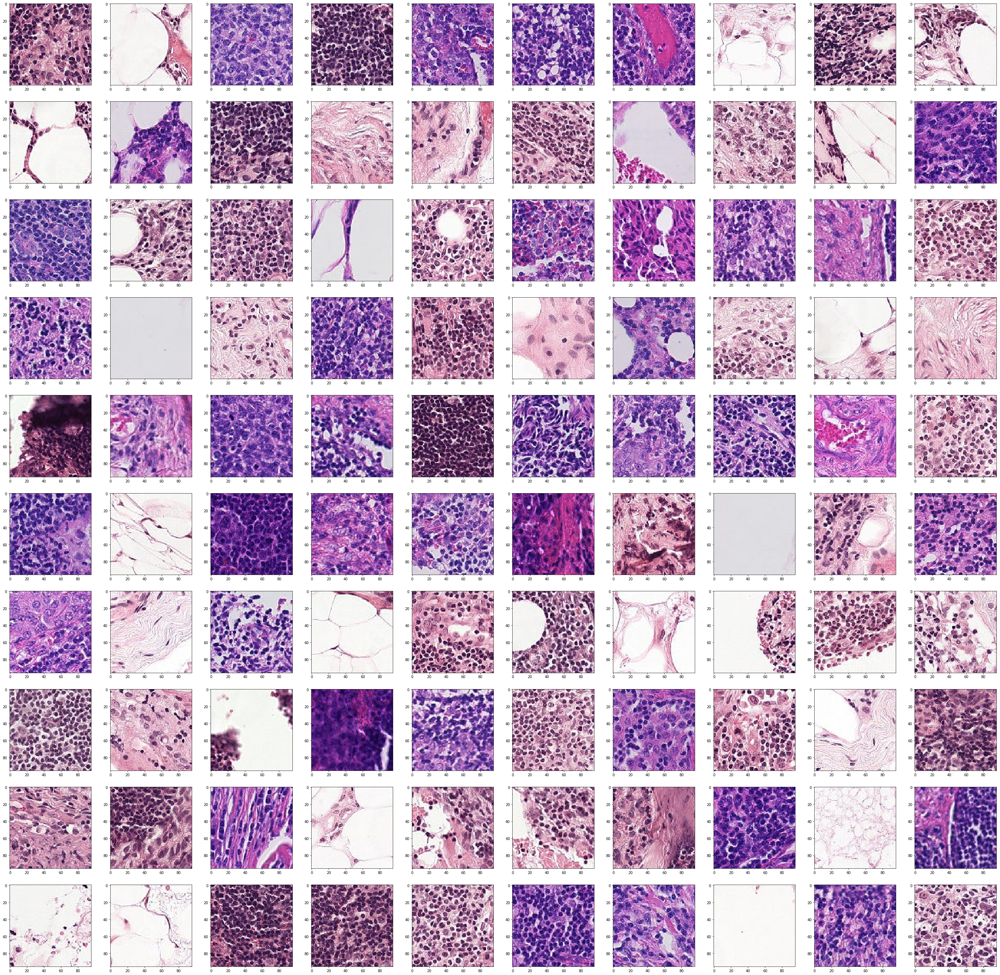

In [120]:
fig, axes = plt.subplots(10,10,figsize=(50,50))
total=0
i=0
j=0
for ind in errores6.index:
    imagen=errores6['archivos'][ind]
    img=mpimg.imread('val/'+str(imagen),'r')
   
    axes[i,j].imshow(img)
    
    if j==9:
        j=0
        i=i+1
    else:
        j=j+1
    
    total=total+1
    if total==100:
        break
   
  

Como particularidad, se observan algunas imágenes en blanco, o con zonas vacías. Se puede deducir que dichas imágenes no son correctas y parece lógico que no se hayan categorizado correctamente. Para el resto, haría falta un experto en cáncer e histopatología para analizar las imágenes.

#### Falsos positivos

In [96]:
### Falsos positivos
mask=df_preds['cancer']>df_preds['no_cancer']
dfFP=df_preds[mask]
mask2=(dfFP['archivos'].str.slice(0, 1)=='n')
dfFP=dfFP[mask2]
print(len(dfFP))
dfFP.head(10)

574


,cancer,no_cancer,archivos
23477,0.946553,0.060517,no_cancer/008fb1f7c9e8d740c07d6eda990312399785...
23532,0.898438,0.106215,no_cancer/00b42e7994c23676d1f76463ba994442121e...
23548,0.934846,0.087320,no_cancer/00b9f9778129b4010aaa2cf9cb61ec493c1f...
23650,0.544186,0.429019,no_cancer/00ebc3685c8af0ec658e70ee275b9b17e7c3...
23665,0.608270,0.389304,no_cancer/00f4e28f8dc6fba4c02c738be94ced0d140d...
23770,0.627942,0.348047,no_cancer/016ea339ac8dcf1e63fef6a34ad53431ad2d...
23880,0.874477,0.127249,no_cancer/01cc63f4b77a20453e00a9df2fde1e8e8405...
23974,0.945524,0.061938,no_cancer/02a3b8e0d4ad016cc2d0a5e955b7d7e91f10...
24161,0.771159,0.243370,no_cancer/03a957f6d7ea2e40a1f7345a4a537bf072a9...
24270,0.913559,0.120994,no_cancer/03e47fdf08d1f7522c9f117064365a7d7ec1...


In [129]:
erroresMask1=dfFP['cancer']<0.5
errores1=dfFP[erroresMask1]
print('Cancer predicho con un menos de un 0.5 de probabilidades: '+str(len(errores1))+ ' imágenes')
erroresMask2=(dfFP['cancer']>=0.5) & (dfFP['cancer']<0.6)
errores2=dfFP[erroresMask2]
print('Cancer predicho con un 0.5 a 0.6 de probabilidades: '+str(len(errores2))+ ' imágenes')
erroresMask3=(dfFP['cancer']>=0.6) & (dfFP['cancer']<0.7)
errores3=dfFP[erroresMask3]
print('Cancer predicho con un 0.6 a 0.7 de probabilidades: '+str(len(errores3))+ ' imágenes')
erroresMask4=(dfFP['cancer']>=0.7) & (dfFP['cancer']<0.8)
errores4=dfFP[erroresMask4]
print('Cancer predicho con un 0.7 a 0.8 de probabilidades: '+str(len(errores4))+ ' imágenes')
erroresMask5=(dfFP['cancer']>=0.8) & (dfFP['cancer']<0.9)
errores5=dfFP[erroresMask5]
print('Cancer predicho con un 0.8 a 0.9 de probabilidades: '+str(len(errores5))+ ' imágenes')
erroresMask6=(dfFP['cancer']>=0.9)
errores6FP=dfFP[erroresMask6]
print('Cancer predicho con más de un 0.9 de probabilidades: '+str(len(errores6FP))+ ' imágenes')

Cancer predicho con un menos de un 0.5 de probabilidades: 7 imágenes
Cancer predicho con un 0.5 a 0.6 de probabilidades: 78 imágenes
Cancer predicho con un 0.6 a 0.7 de probabilidades: 74 imágenes
Cancer predicho con un 0.7 a 0.8 de probabilidades: 81 imágenes
Cancer predicho con un 0.8 a 0.9 de probabilidades: 114 imágenes
Cancer predicho con más de un 0.9 de probabilidades: 220 imágenes


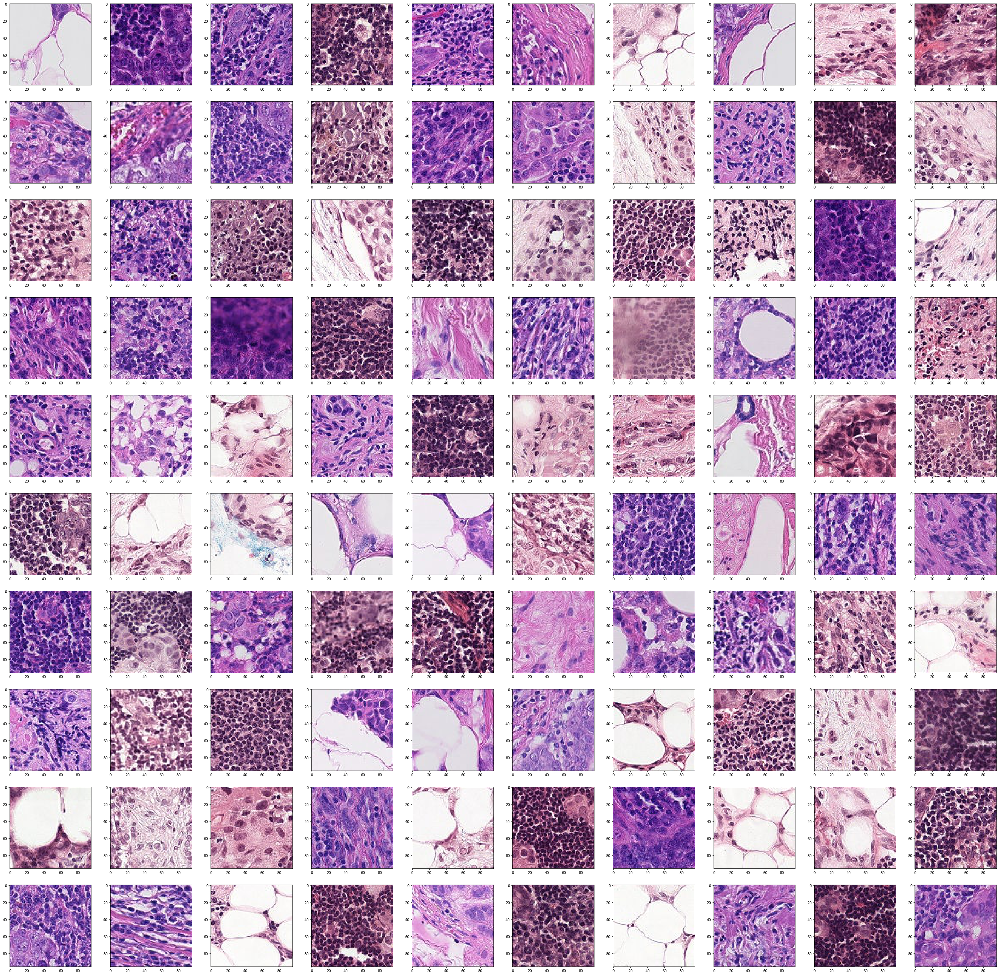

In [130]:
fig, axes = plt.subplots(10,10,figsize=(50,50))
total=0
i=0
j=0
for ind in errores6FP.index:
    imagen=errores6FP['archivos'][ind]
    img=mpimg.imread('val/'+str(imagen),'r')
   
    axes[i,j].imshow(img)
    
    if j==9:
        j=0
        i=i+1
    else:
        j=j+1
    
    total=total+1
    if total==100:
        break

## Comparativa de exactitud (accuracy) entre los distintos modelos

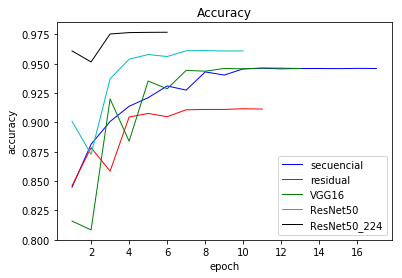

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline
fig,axis = plt.subplots(1,1)

validationSec=[0.8448,0.8814,0.9008,0.9138,0.9211,0.9311, 0.9276,0.9431,0.9404, 0.9457, 0.9462,0.9457, 0.9460, 0.9460,0.9459,0.9461,0.9460]
validationRes=[0.8460,0.8785,0.8585,0.9046,0.9077,0.9049,0.9108,0.9111,0.9111,0.9117,0.9114]
validationVGG16=[0.8159,0.8084,0.9200,0.8840,0.9353,0.9287,0.9444,0.9437,0.9460,0.9457,0.9464,0.9463,0.9460] 
validationRes50=[0.9010,0.8729,0.9372, 0.9539, 0.9579,0.9562,0.9611,0.9613,0.9609, 0.9610] 
validationRes50_224=[0.9610,0.9516,0.9754, 0.9766, 0.9768,0.9769]

axis.plot(list(range(1,18)),validationSec,'b-',label='secuencial',linewidth=1) 
axis.plot(list(range(1,12)),validationRes,'r',label='residual',linewidth=1) 
axis.plot(list(range(1,14)),validationVGG16,'g',label='VGG16',linewidth=1) 
axis.plot(list(range(1,11)),validationRes50,'c',label='ResNet50',linewidth=1)
axis.plot(list(range(1,7)),validationRes50_224,'k',label='ResNet50_224',linewidth=1) 
axis.legend(loc='best') 
axis.set_xlabel('epoch')
axis.set_ylabel('accuracy')
plt.title('Accuracy')
plt.show() 


## Comparativa de pérdida (loss) entre los distintos modelos

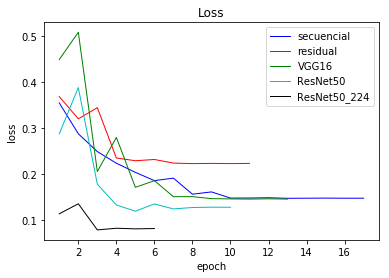

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
fig,axis = plt.subplots(1,1)

secuentialLoss=[0.3545,0.2876 ,0.2488 ,0.2237 ,0.2038 ,0.1858 ,0.1912 ,0.1563 ,0.1613 ,0.1479 ,0.1480 ,0.1486 ,0.1474 ,0.1476 ,0.1478 ,0.1476 ,0.1476 ]
residualLoss=[0.3683,0.3201,0.3442,0.2350,0.2290,0.2317,0.2239,0.2228,0.2232,0.2228,0.2232]
vgg16loss=[0.4490,0.5082,0.2055,0.2797,0.1712,0.1857,0.1509,0.1510,0.1467,0.1461,0.1457,0.1463,0.1457]
resnet50loss=[0.2877,0.388,0.178,0.1329,0.1194,0.1351,0.1243,0.1274,0.1281, 0.1279]
resnet50loss_224loss=[0.1137,0.1355,0.0787,0.0823,0.0810,0.0817]

axis.plot(list(range(1,18)),secuentialLoss,'b-',label='secuencial',linewidth=1) 
axis.plot(list(range(1,12)),residualLoss,'r',label='residual',linewidth=1) 
axis.plot(list(range(1,14)),vgg16loss,'g',label='VGG16',linewidth=1) 
axis.plot(list(range(1,11)),resnet50loss,'c',label='ResNet50',linewidth=1)
axis.plot(list(range(1,7)),resnet50loss_224loss,'k',label='ResNet50_224',linewidth=1) 
axis.legend(loc='best') 
axis.set_xlabel('epoch')
axis.set_ylabel('loss')
plt.title('Loss')
plt.show() 



Tal y como se desprende de los resultados, el mejor modelo ha resultado ser el basado en ResNet50 con imágenes de 224x224